# Images extraction and analysis from a PDF file using Azure Open AI GPT4-Vision

In [1]:
# %pip install Spire.Pdf

In [2]:
import base64
import datetime
import json
import os
import openai
import requests
import shutil
import time

from dotenv import load_dotenv
from PIL import Image as PILimage
from spire.pdf.common import *
from spire.pdf import *

In [3]:
def check_openai_version():
    """
    Check Azure Open AI version
    """
    installed_version = openai.__version__

    try:
        version_number = float(installed_version[:3])
    except ValueError:
        print("Invalid OpenAI version format")
        return

    print(f"Installed OpenAI version: {installed_version}")

    if version_number < 1.0:
        print("[Warning] You should upgrade OpenAI to have version >= 1.0.0")
        print("To upgrade, run: %pip install openai --upgrade")
    else:
        print(f"[OK] OpenAI version {installed_version} is >= 1.0.0")

In [4]:
check_openai_version()

Installed OpenAI version: 1.6.0
[OK] OpenAI version 1.6.0 is >= 1.0.0


In [5]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [6]:
print(f"Today is {datetime.datetime.today().strftime('%d-%b-%Y %H:%M:%S')}")

Today is 04-Jan-2024 14:55:31


In [7]:
print(f"Python version: {sys.version}")

Python version: 3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]


In [8]:
print(f"OpenAI version: {openai.__version__}")

OpenAI version: 1.6.0


## Azure Open AI

In [9]:
load_dotenv("azure.env")

# Azure Open AI
openai.api_type: str = "azure"
openai.api_key = os.getenv("OPENAI_API_KEY")
openai.api_base = os.getenv("OPENAI_API_BASE")

# Azure AI Vision (aka Azure Computer Vision)
azure_aivision_endpoint = os.getenv("azure_aivision_endpoint")
azure_aivision_key = os.getenv("azure_aivision_key")

In [10]:
model = "GPT4Vision"  # This is the deployed name of your GPT4 Vision model from the Azure Open AI studio

In [11]:
indexname = "pdf-docs"

## Directory to save extracted images from the PDF file

In [12]:
images_dir = "images"

if os.path.exists(images_dir):
    shutil.rmtree(images_dir)

os.makedirs(images_dir, exist_ok=True)

## Running the extraction of all the images from the PDF file

In [13]:
pdf_file = "ios17.pdf"

In [14]:
!ls $pdf_file -lh

-rwxrwxrwx 1 root root 6.0M Jan  4 11:07 ios17.pdf


In [15]:
# Reading the pdf file
doc = PdfDocument()
doc.LoadFromFile(pdf_file)

images_list = []
nb = 0
print(f"Extracting images from PDF file {pdf_file}\n")

# For each page
for p in range(doc.Pages.Count):
    page = doc.Pages.get_Item(p)
    idx = 1
    # Extract any image from the page and save each image to a png file
    for image in page.ExtractImages():
        image_file = (
            image_file
        ) = f"{images_dir}/{os.path.splitext(os.path.basename(pdf_file))[0]}_page_{p + 1:03}_nb_{idx:02}.png"
        image.Save(image_file, ImageFormat.get_Png())
        print(f"{nb + 1:04} Saving image to {image_file}")
        images_list.append(image_file)
        idx += 1
        nb += 1

doc.Close()
print("\nDone")
print(f"{nb} images were saved.")

Extracting images from PDF file ios17.pdf

0001 Saving image to images/ios17_page_001_nb_01.png
0002 Saving image to images/ios17_page_001_nb_02.png
0003 Saving image to images/ios17_page_002_nb_01.png
0004 Saving image to images/ios17_page_002_nb_02.png
0005 Saving image to images/ios17_page_003_nb_01.png
0006 Saving image to images/ios17_page_003_nb_02.png
0007 Saving image to images/ios17_page_004_nb_01.png
0008 Saving image to images/ios17_page_004_nb_02.png
0009 Saving image to images/ios17_page_005_nb_01.png
0010 Saving image to images/ios17_page_005_nb_02.png
0011 Saving image to images/ios17_page_006_nb_01.png
0012 Saving image to images/ios17_page_007_nb_01.png
0013 Saving image to images/ios17_page_007_nb_02.png
0014 Saving image to images/ios17_page_008_nb_01.png
0015 Saving image to images/ios17_page_009_nb_01.png
0016 Saving image to images/ios17_page_009_nb_02.png
0017 Saving image to images/ios17_page_010_nb_01.png

Done
17 images were saved.


In [16]:
print(f"Number of extracted images from the PDF file = {len(images_list)}")

Number of extracted images from the PDF file = 17


## Viewing all the extracted images

In [17]:
!ls $images_dir -lh

total 5.6M
-rwxrwxrwx 1 root root  86K Jan  4 14:55 ios17_page_001_nb_01.png
-rwxrwxrwx 1 root root 269K Jan  4 14:55 ios17_page_001_nb_02.png
-rwxrwxrwx 1 root root 763K Jan  4 14:55 ios17_page_002_nb_01.png
-rwxrwxrwx 1 root root 575K Jan  4 14:55 ios17_page_002_nb_02.png
-rwxrwxrwx 1 root root 383K Jan  4 14:55 ios17_page_003_nb_01.png
-rwxrwxrwx 1 root root 324K Jan  4 14:55 ios17_page_003_nb_02.png
-rwxrwxrwx 1 root root 226K Jan  4 14:55 ios17_page_004_nb_01.png
-rwxrwxrwx 1 root root 272K Jan  4 14:55 ios17_page_004_nb_02.png
-rwxrwxrwx 1 root root 347K Jan  4 14:55 ios17_page_005_nb_01.png
-rwxrwxrwx 1 root root 351K Jan  4 14:55 ios17_page_005_nb_02.png
-rwxrwxrwx 1 root root 563K Jan  4 14:55 ios17_page_006_nb_01.png
-rwxrwxrwx 1 root root 421K Jan  4 14:55 ios17_page_007_nb_01.png
-rwxrwxrwx 1 root root 134K Jan  4 14:55 ios17_page_007_nb_02.png
-rwxrwxrwx 1 root root 215K Jan  4 14:55 ios17_page_008_nb_01.png
-rwxrwxrwx 1 root root 274K Jan  4 14:55 ios17_page_009_nb_01.png

In [18]:
%%javascript Python
OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>

01 Extracted image file: images/ios17_page_001_nb_01.png


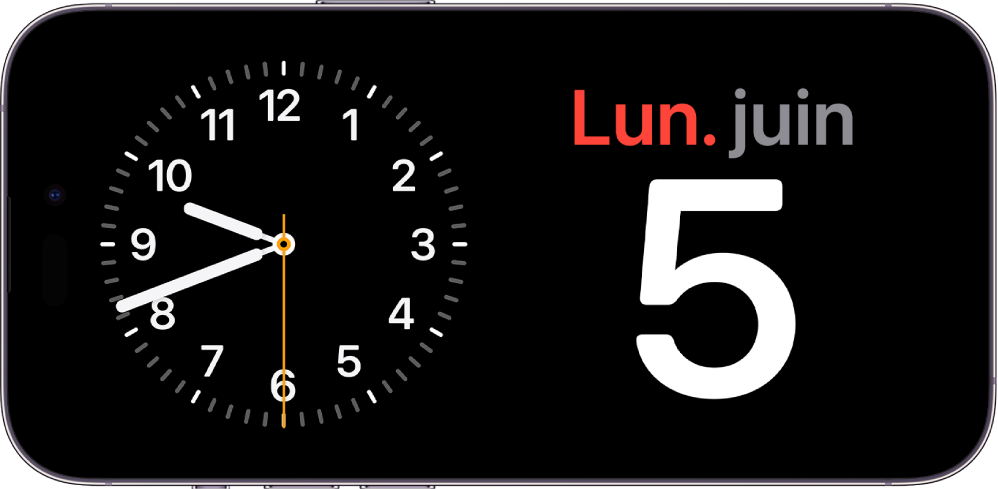

02 Extracted image file: images/ios17_page_001_nb_02.png


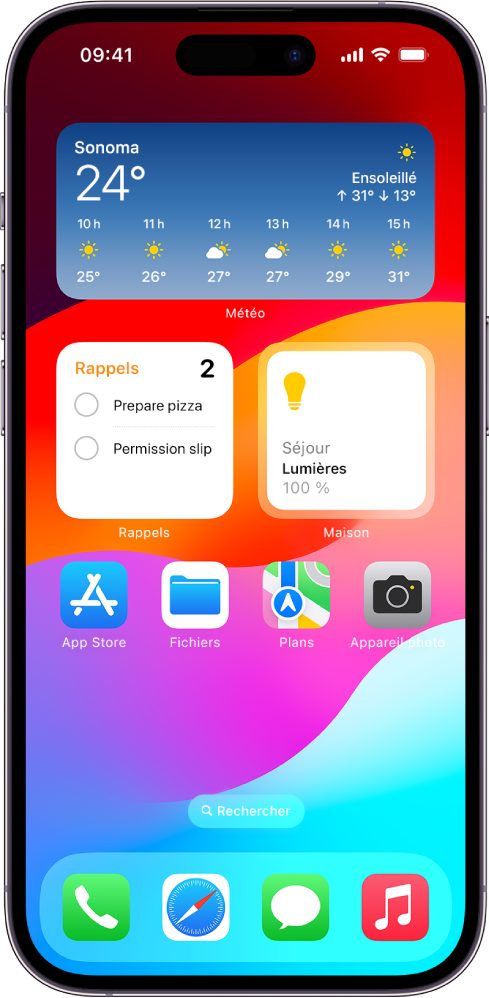

03 Extracted image file: images/ios17_page_002_nb_01.png


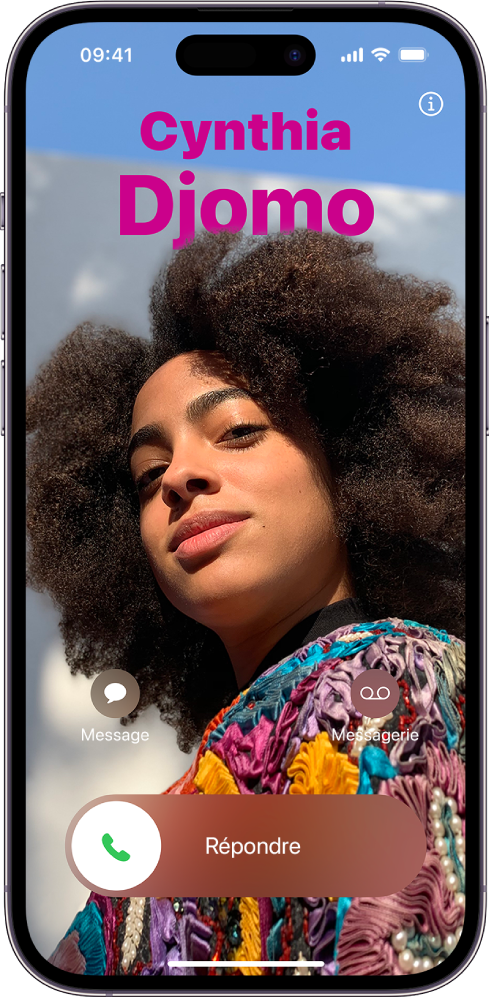

04 Extracted image file: images/ios17_page_002_nb_02.png


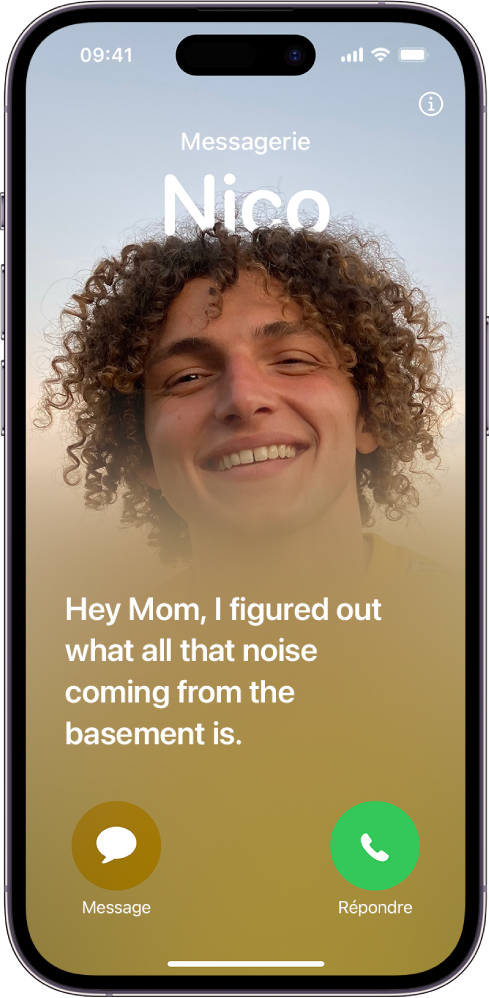

05 Extracted image file: images/ios17_page_003_nb_01.png


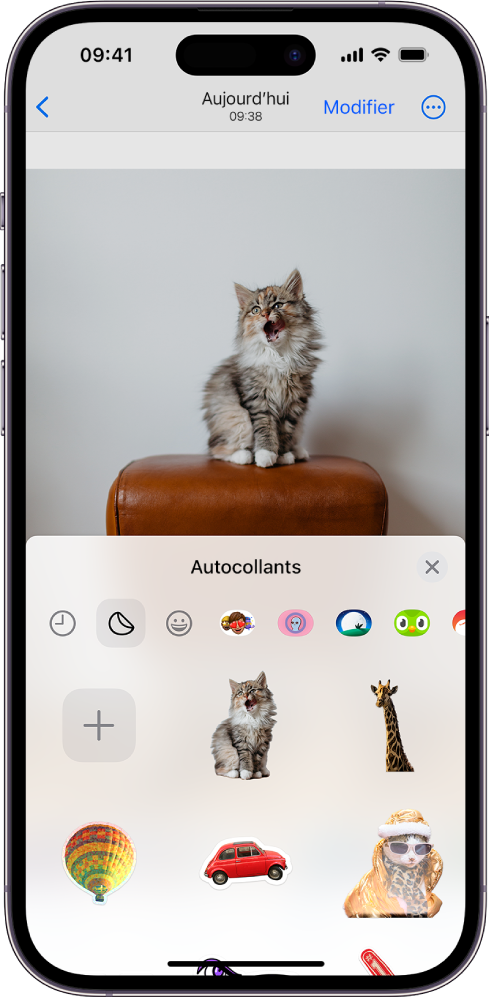

06 Extracted image file: images/ios17_page_003_nb_02.png


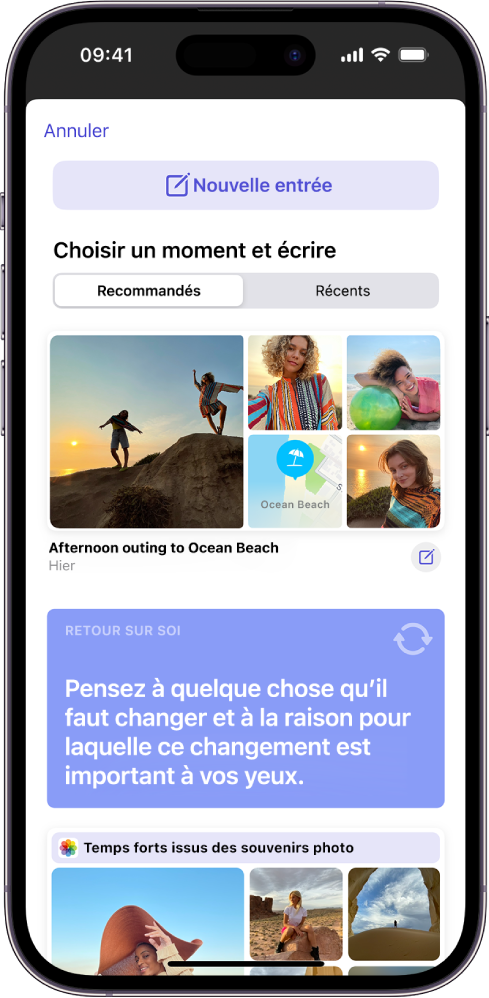

07 Extracted image file: images/ios17_page_004_nb_01.png


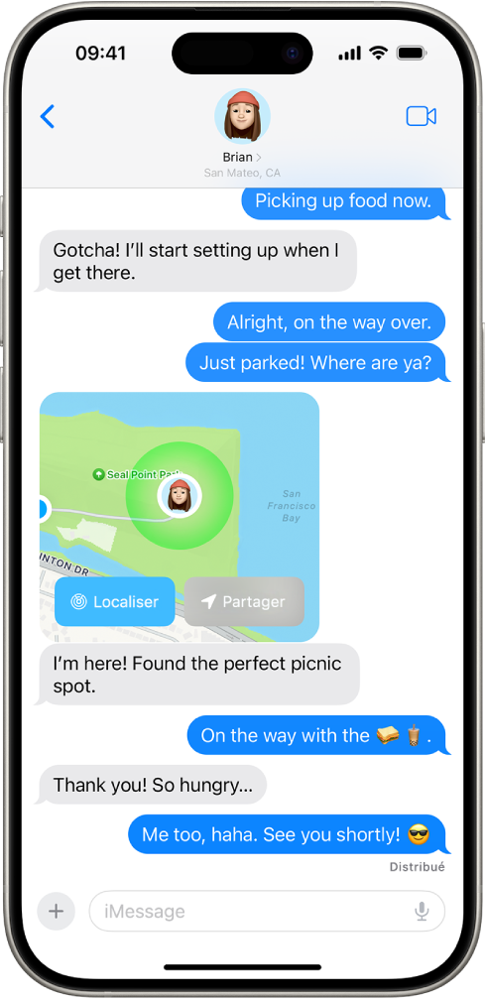

08 Extracted image file: images/ios17_page_004_nb_02.png


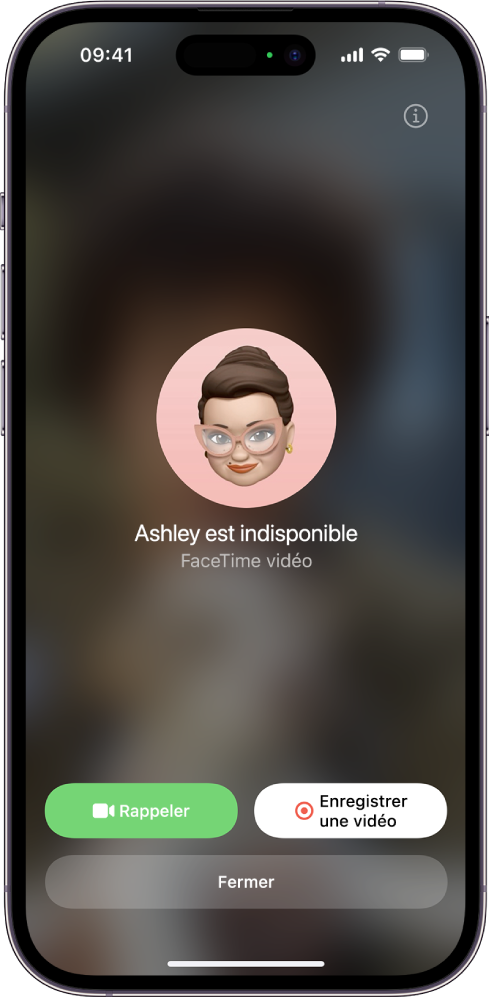

09 Extracted image file: images/ios17_page_005_nb_01.png


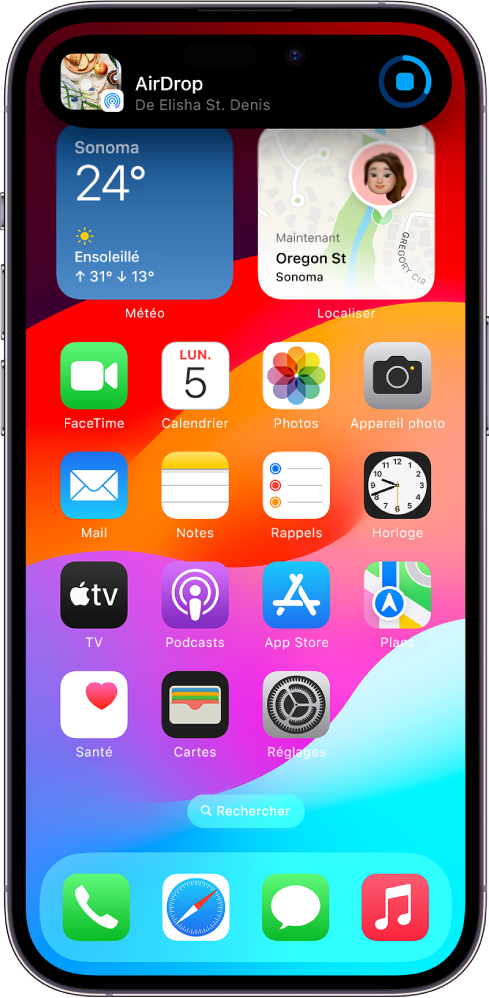

10 Extracted image file: images/ios17_page_005_nb_02.png


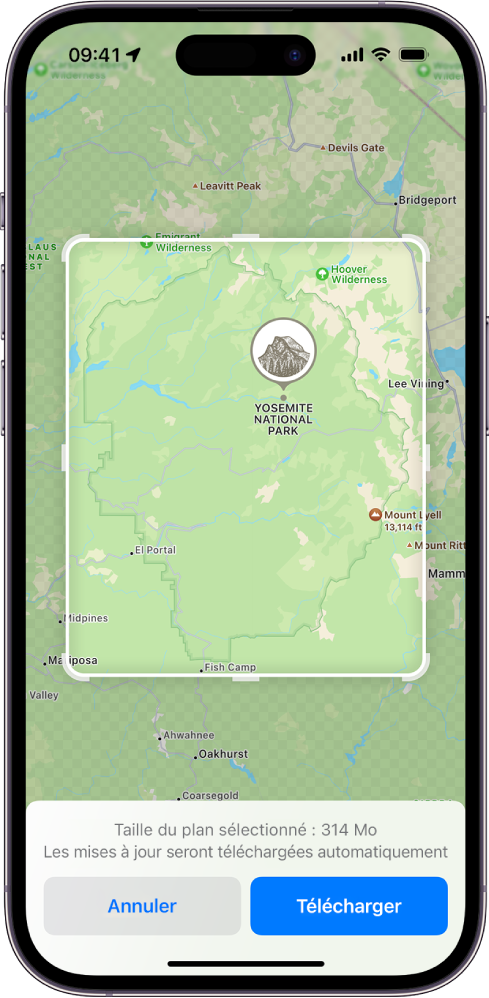

11 Extracted image file: images/ios17_page_006_nb_01.png


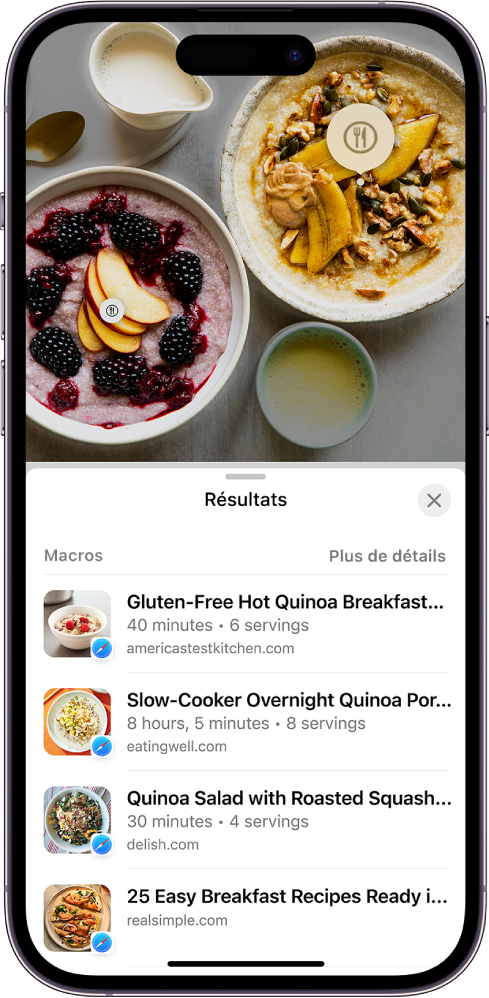

12 Extracted image file: images/ios17_page_007_nb_01.png


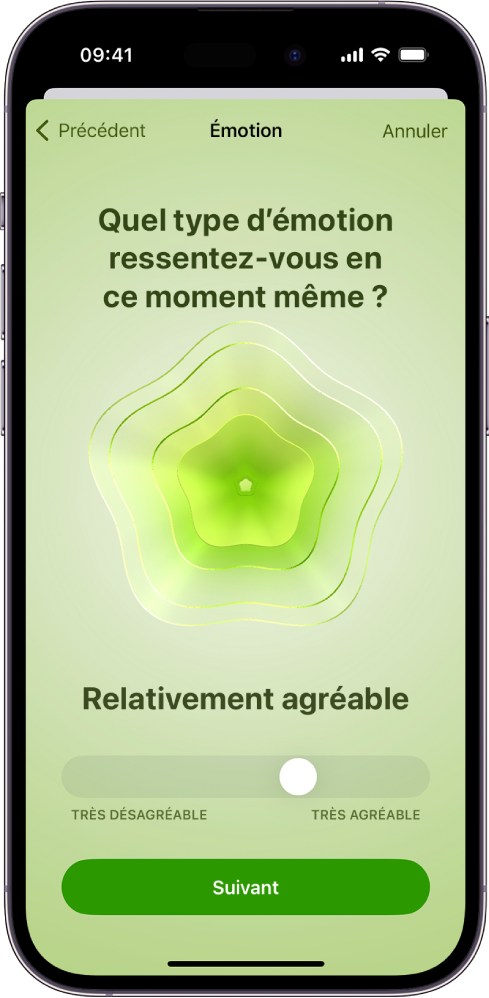

13 Extracted image file: images/ios17_page_007_nb_02.png


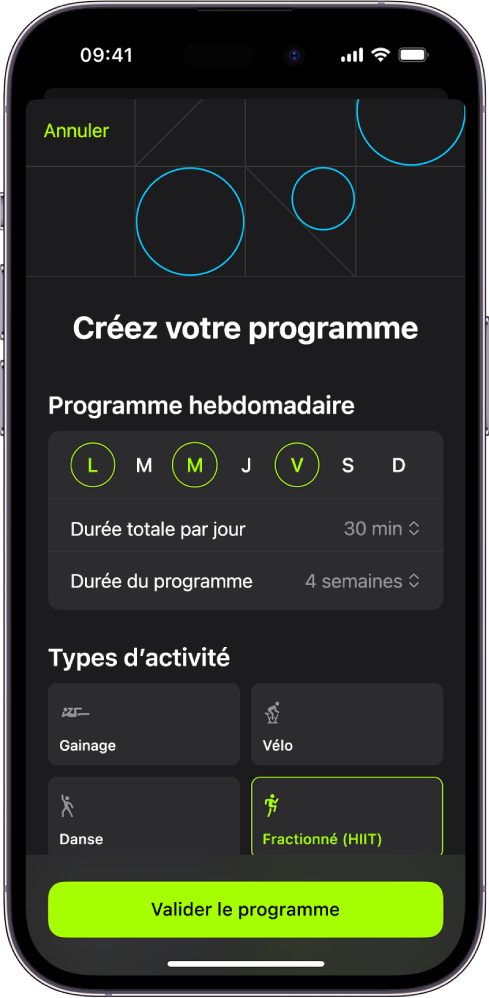

14 Extracted image file: images/ios17_page_008_nb_01.png


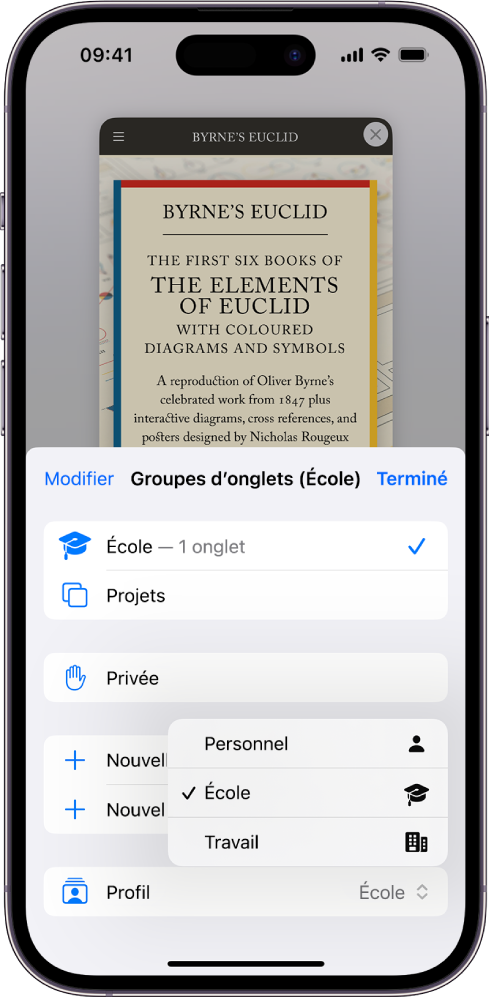

15 Extracted image file: images/ios17_page_009_nb_01.png


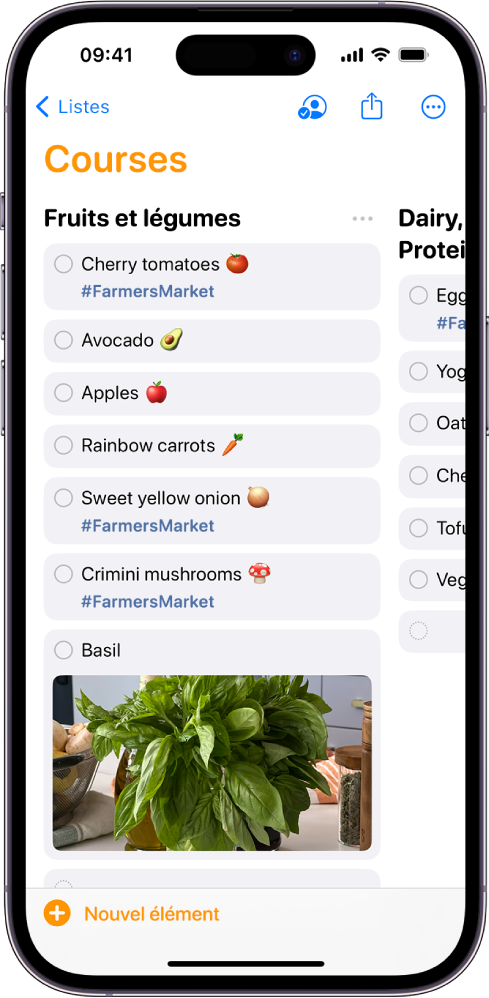

16 Extracted image file: images/ios17_page_009_nb_02.png


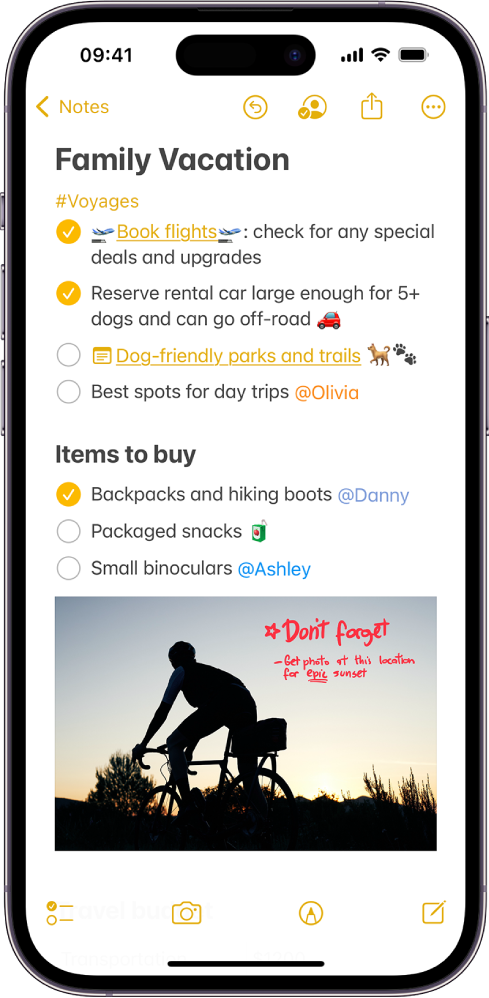

17 Extracted image file: images/ios17_page_010_nb_01.png


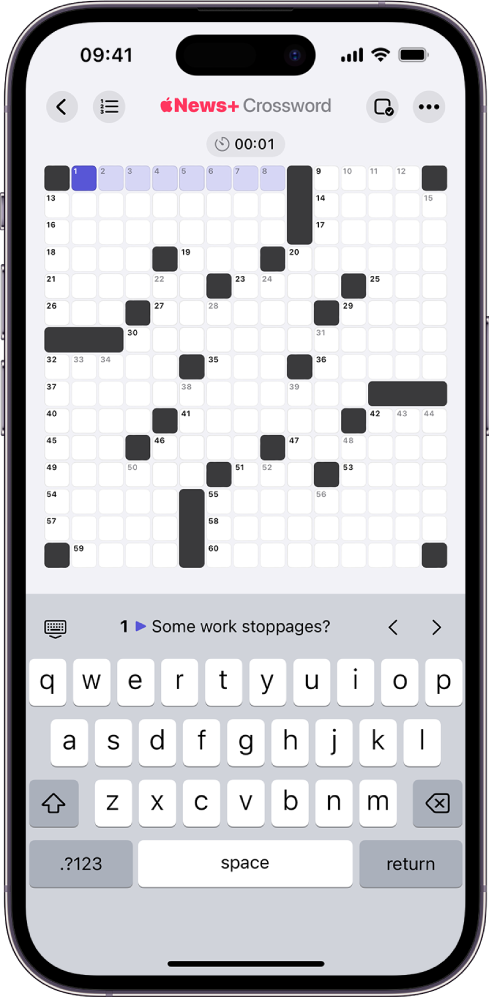


End


In [19]:
for idx in range(len(images_list)):
    print(f"{idx+1:02} Extracted image file: {images_list[idx]}")
    display(PILimage.open(images_list[idx]))

print("\nEnd")

## Analysing these extracted images with GPT4 Vision

In [20]:
def GPT4V_with_AzureAIVision(image_file, prompt, disp=False):
    """
    GPT-4 Turbo with vision and Azure AI enhancements
    """
    # Testing if image file exists
    if not os.path.exists(image_file):
        print(f"[Error] Image file {image_file} does not exist.")

    # Endpoint
    base_url = f"{openai.api_base}/openai/deployments/{model}"
    gpt4vision_endpoint = (
        f"{base_url}/extensions/chat/completions?api-version=2023-12-01-preview"
    )

    # Header
    headers = {"Content-Type": "application/json", "api-key": openai.api_key}

    # Encoded image
    base_64_encoded_image = base64.b64encode(open(image_file, "rb").read()).decode(
        "ascii"
    )

    # Context
    context = "You are an AI assistant. You analyse an image and make some answers based on a prompt. Always reply in English."

    # Payload
    json_data = {
        "model": "gpt-4-vision-preview",
        "enhancements": {"ocr": {"enabled": True}, "grounding": {"enabled": True}},
        "dataSources": [
            {
                "type": "AzureComputerVision",
                "endpoint": azure_aivision_endpoint,
                "key": azure_aivision_key,
                "indexName": indexname,
            }
        ],
        "messages": [
            {"role": "system", "content": context},
            {"role": "user", "content": [prompt, {"image": base_64_encoded_image}]},
        ],
        "max_tokens": 4000,
        "temperature": 0.2,
        "top_p": 1,
    }

    # Response
    response = requests.post(
        gpt4vision_endpoint, headers=headers, data=json.dumps(json_data)
    )

    # Testing the status code from the model response
    if response.status_code == 200:
        now = str(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"))
        print(f"Analysis of image: {image_file}")
        results = json.loads(response.text)
        print("\033[1;31;34m")
        print(results["choices"][0]["message"]["content"])

        prompt_tokens = results["usage"]["prompt_tokens"]
        completion_tokens = results["usage"]["completion_tokens"]
        total_tokens = results["usage"]["total_tokens"]

        print("\n\033[1;31;32mDone:", now)
        print(
            f"Prompt tokens = {prompt_tokens} | Completion tokens = {completion_tokens} \
| Total tokens = {total_tokens}"
        )
        print("\n[Note] These results are generated by an AI")
        print("\033[0m")

        if disp:
            return results

    elif response.status_code == 429:
        print(
            "[429 Error] Too many requests. Please wait a couple of seconds and try again.\n"
        )
        print(json.loads(response.text))

    else:
        print(f"[Error] Error code: {response.status_code}\n")
        print(json.loads(response.text))

Analysing all extracted images with Azure Open AI GPT4 Turbo with Vision

01 Extracted image file: images/ios17_page_001_nb_01.png


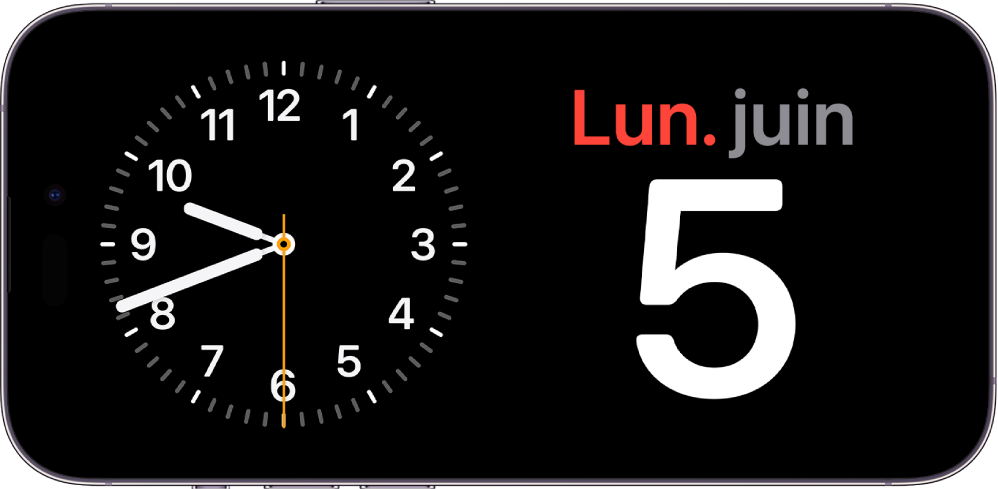

Analysis of image: images/ios17_page_001_nb_01.png

A smartphone displaying a clock and the date Monday, June 5.

Hashtags: #TimeCheck #SmartphoneClock #June5th #MondayMood

Emojis: 📱⏰🗓️🔟➖2️⃣

Done: 04-Jan-2024 14:57:12
Prompt tokens = 593 | Completion tokens = 56 | Total tokens = 649

[Note] These results are generated by an AI

02 Extracted image file: images/ios17_page_001_nb_02.png


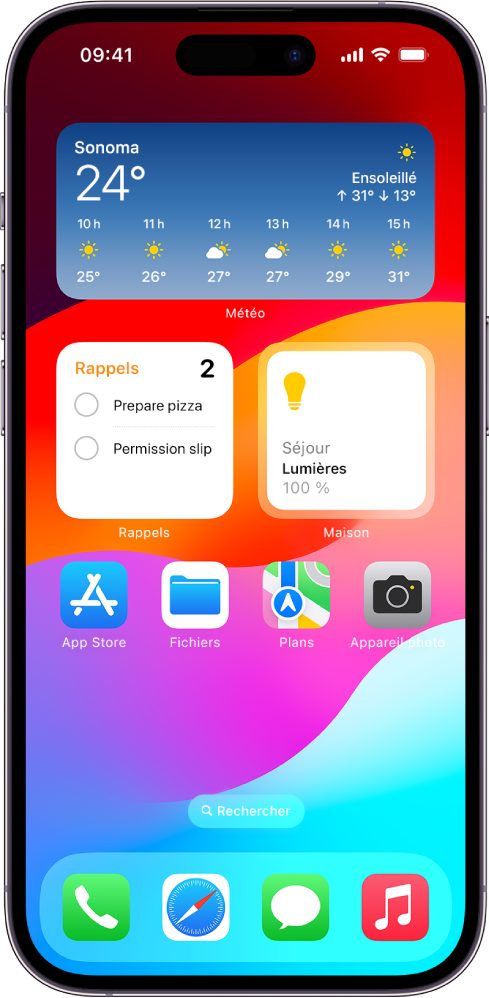

Analysis of image: images/ios17_page_001_nb_02.png

A smartphone screen displaying the weather forecast for Sonoma with sunny conditions and rising temperatures throughout the day, alongside reminders and various app icons.

Hashtags: #SunnyDay #WeatherForecast #Sonoma #Productivity #Smartphone

Emojis: ☀️📱🌡️🍕📝

Done: 04-Jan-2024 14:57:59
Prompt tokens = 683 | Completion tokens = 66 | Total tokens = 749

[Note] These results are generated by an AI

03 Extracted image file: images/ios17_page_002_nb_01.png


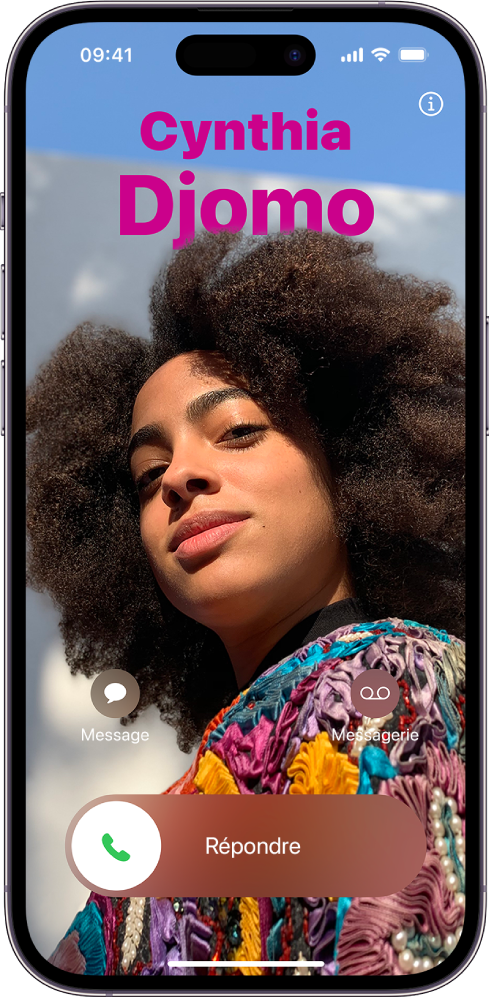

Analysis of image: images/ios17_page_002_nb_01.png

A colorful incoming call screen on a smartphone displaying the name Cynthia Djomo.

Hashtags: #ColorfulCall #SmartphoneScreen #CynthiaDjomo 📱🌈📞

Emojis: 📲💬🔊

Done: 04-Jan-2024 14:58:44
Prompt tokens = 619 | Completion tokens = 53 | Total tokens = 672

[Note] These results are generated by an AI

04 Extracted image file: images/ios17_page_002_nb_02.png


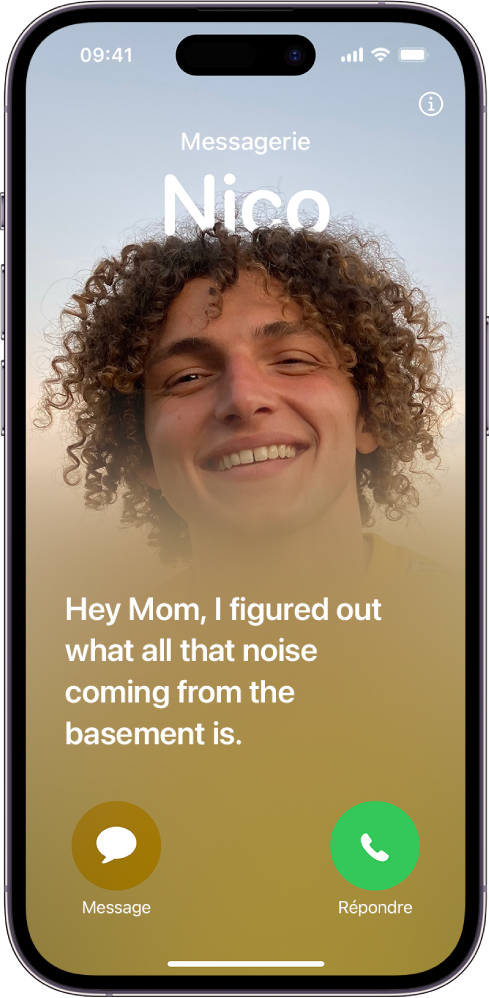

Analysis of image: images/ios17_page_002_nb_02.png

A text message from Nico to Mom about discovering the source of basement noise.

Hashtags: #MysterySolved #BasementSecrets #NoiseInvestigation #TextsFromNico

Emojis: 🕵️‍♂️🔍👩‍👦🏠📱

Done: 04-Jan-2024 14:59:25
Prompt tokens = 635 | Completion tokens = 68 | Total tokens = 703

[Note] These results are generated by an AI

05 Extracted image file: images/ios17_page_003_nb_01.png


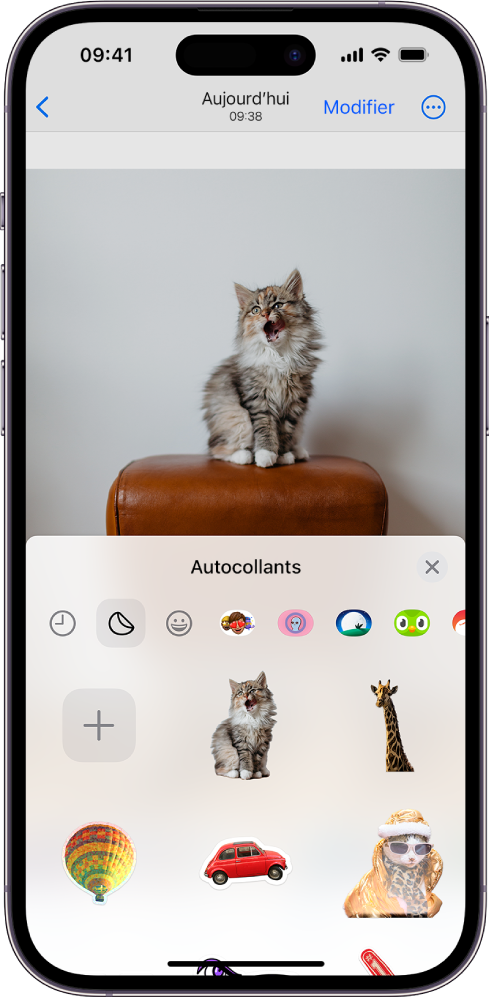

Analysis of image: images/ios17_page_003_nb_01.png

A screenshot of a smartphone editing interface with a photo of a cat on a chair.

Hashtags: #CatPhoto #EditingOnTheGo #SnapshotMoments #PurrfectPic #DigitalScrapbooking

Emojis: 🐱📱✂️🖼️🎨

Done: 04-Jan-2024 15:00:16
Prompt tokens = 626 | Completion tokens = 62 | Total tokens = 688

[Note] These results are generated by an AI

06 Extracted image file: images/ios17_page_003_nb_02.png


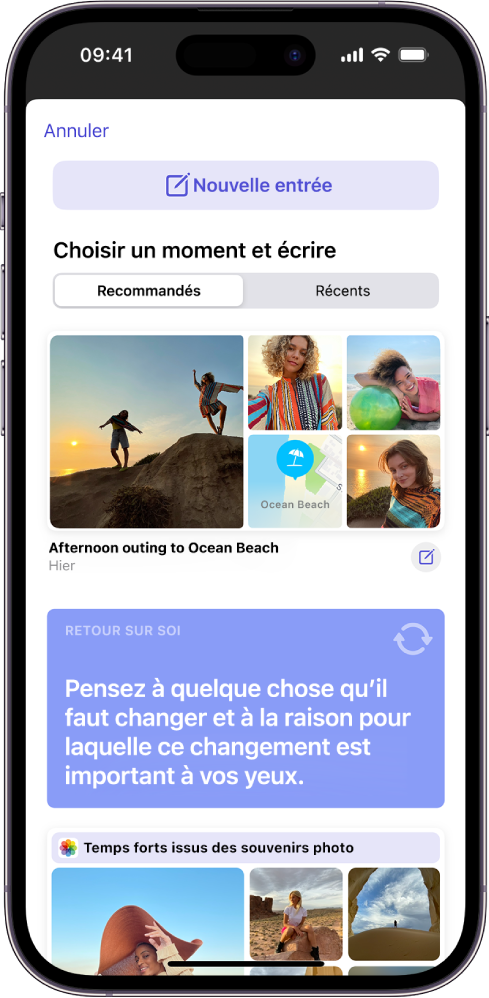

Analysis of image: images/ios17_page_003_nb_02.png

A smartphone screen displaying a journaling app with a prompt for self-reflection and memories from an afternoon outing to Ocean Beach.

Hashtags: #JournalingApp #SelfReflection #MemoryLane #OceanBeach #AfternoonAdventure #Mindfulness

Emojis: 📱✍️🌊🏖️🤔💭

Done: 04-Jan-2024 15:00:56
Prompt tokens = 687 | Completion tokens = 71 | Total tokens = 758

[Note] These results are generated by an AI

07 Extracted image file: images/ios17_page_004_nb_01.png


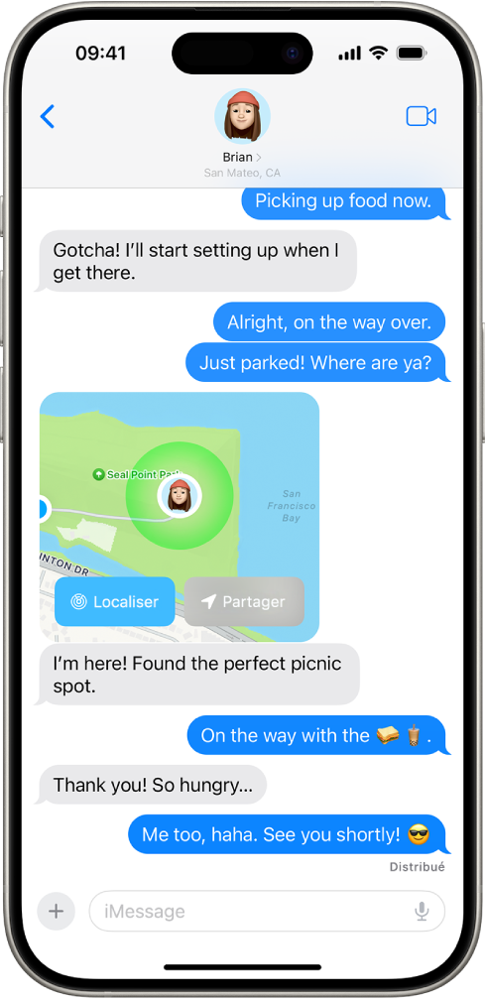

Analysis of image: images/ios17_page_004_nb_01.png

A conversation about coordinating a picnic setup and food pickup, with a shared location.

Hashtags: #PicnicPlanning #FoodPickup #PerfectSpot #Meetup

Emojis: 📍🍔🥤🌳📱👍

Done: 04-Jan-2024 15:01:52
Prompt tokens = 708 | Completion tokens = 54 | Total tokens = 762

[Note] These results are generated by an AI

08 Extracted image file: images/ios17_page_004_nb_02.png


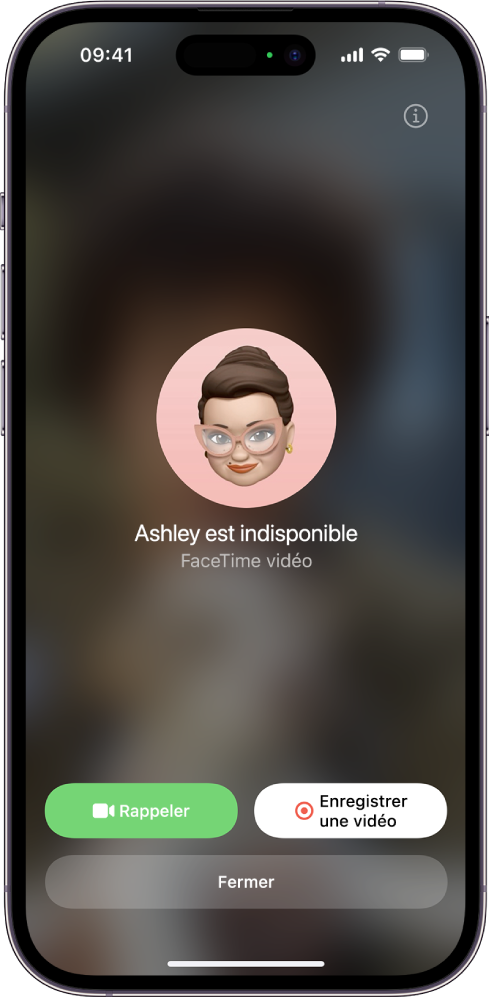

Analysis of image: images/ios17_page_004_nb_02.png

Missed FaceTime video call with an option to call back or record a video.

Hashtags: #MissedCall #FaceTime #BetterLuckNextTime #CallMeBack

Emojis: 📱🎥🚫🕘

Done: 04-Jan-2024 15:02:37
Prompt tokens = 629 | Completion tokens = 52 | Total tokens = 681

[Note] These results are generated by an AI

09 Extracted image file: images/ios17_page_005_nb_01.png


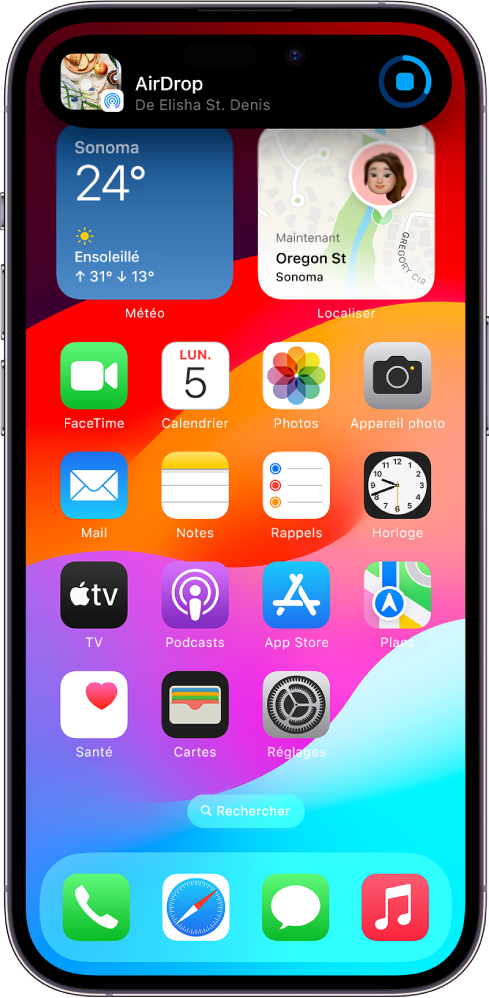

Analysis of image: images/ios17_page_005_nb_01.png

A smartphone screen displaying various apps and widgets, including weather and maps, with a sunny forecast for Sonoma.

Hashtags: #Smartphone #WeatherUpdate #SunnyDay #TechLife #Widgets #ProductivityApps

Emojis: 📱☀️🗺️🌡️🔍

Done: 04-Jan-2024 15:03:18
Prompt tokens = 729 | Completion tokens = 65 | Total tokens = 794

[Note] These results are generated by an AI

10 Extracted image file: images/ios17_page_005_nb_02.png


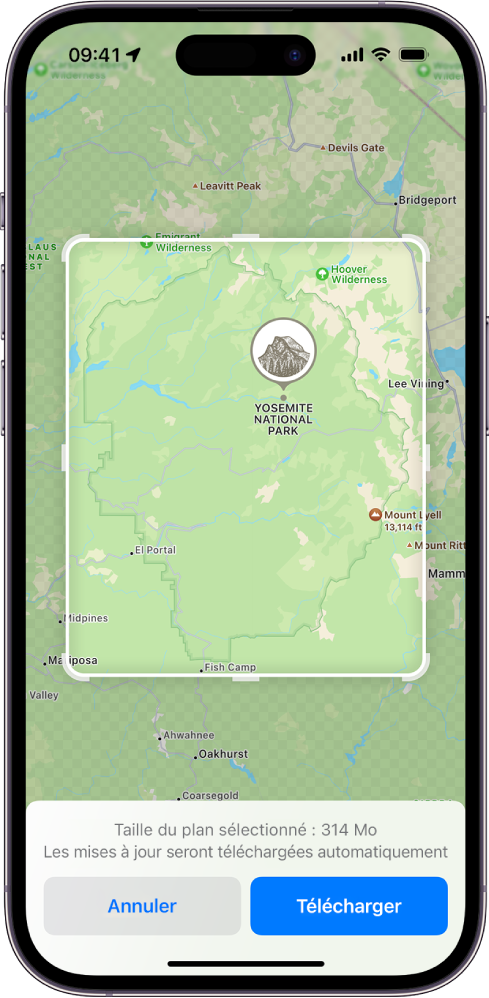

Analysis of image: images/ios17_page_005_nb_02.png

A screenshot of a mobile phone displaying a map of Yosemite National Park for download.

Hashtags: #YosemiteNationalPark #MapDownload #ExploreNature #HikingAdventures #DigitalMap

Emojis: 🗺️📱🌲🏞️🥾

Done: 04-Jan-2024 15:03:58
Prompt tokens = 703 | Completion tokens = 60 | Total tokens = 763

[Note] These results are generated by an AI

11 Extracted image file: images/ios17_page_006_nb_01.png


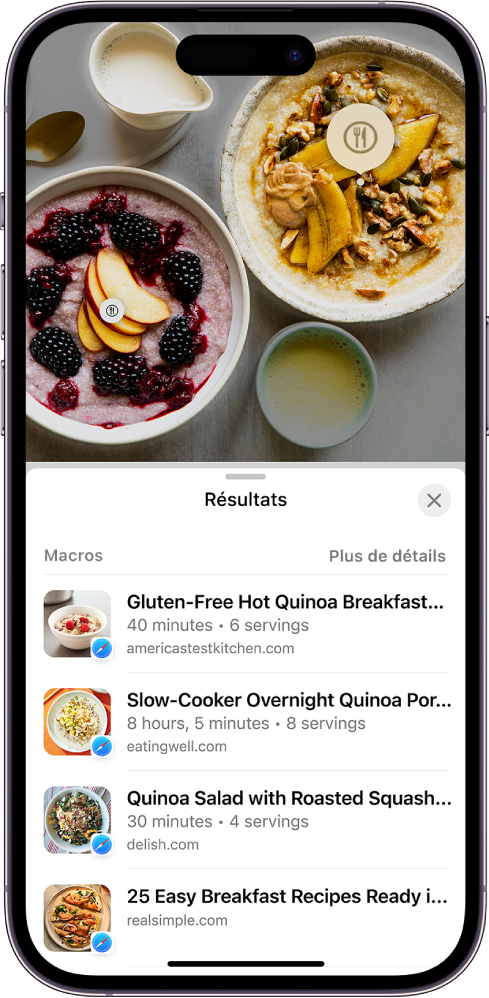

Analysis of image: images/ios17_page_006_nb_01.png

A smartphone displaying a variety of quinoa breakfast recipes from different websites.

Hashtags: #QuinoaBreakfast #HealthyEating #GlutenFree #Foodie #RecipeIdeas

Emojis: 🥣🌾🍓🍌🕒

Done: 04-Jan-2024 15:04:39
Prompt tokens = 659 | Completion tokens = 56 | Total tokens = 715

[Note] These results are generated by an AI

12 Extracted image file: images/ios17_page_007_nb_01.png


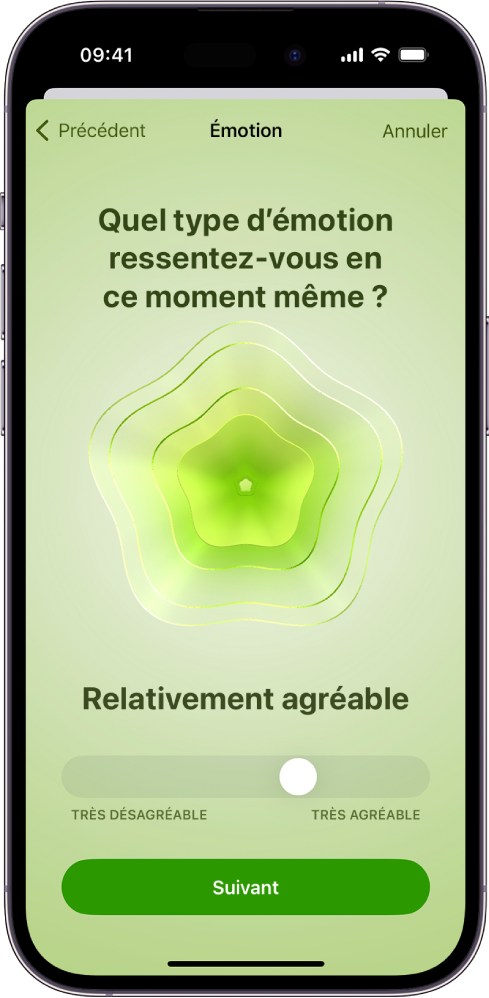

Analysis of image: images/ios17_page_007_nb_01.png

A mobile screen displaying an emotion tracking app asking the user to rate their current feeling from very unpleasant to very pleasant.

Hashtags: #MoodTracker #EmotionRating #SelfAwareness #MentalHealth

Emojis: 😌📱🔍👍🏼💚

Done: 04-Jan-2024 15:05:18
Prompt tokens = 631 | Completion tokens = 62 | Total tokens = 693

[Note] These results are generated by an AI

13 Extracted image file: images/ios17_page_007_nb_02.png


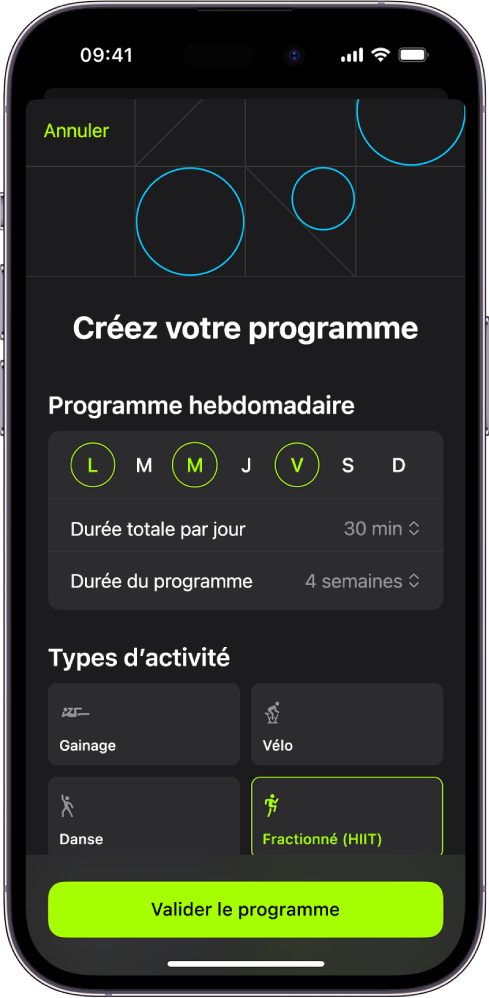

Analysis of image: images/ios17_page_007_nb_02.png

A screenshot of a fitness app for creating a weekly exercise program with options for planking, cycling, dance, and HIIT.

Hashtags: #FitnessApp #WeeklyWorkoutPlan #ExerciseGoals #Plank #Cycling #Dance #HIIT #StayActive #HealthTech

Emojis: 📱💪🚴‍♂️🕺⏱️🔥

Done: 04-Jan-2024 15:06:11
Prompt tokens = 651 | Completion tokens = 85 | Total tokens = 736

[Note] These results are generated by an AI

14 Extracted image file: images/ios17_page_008_nb_01.png


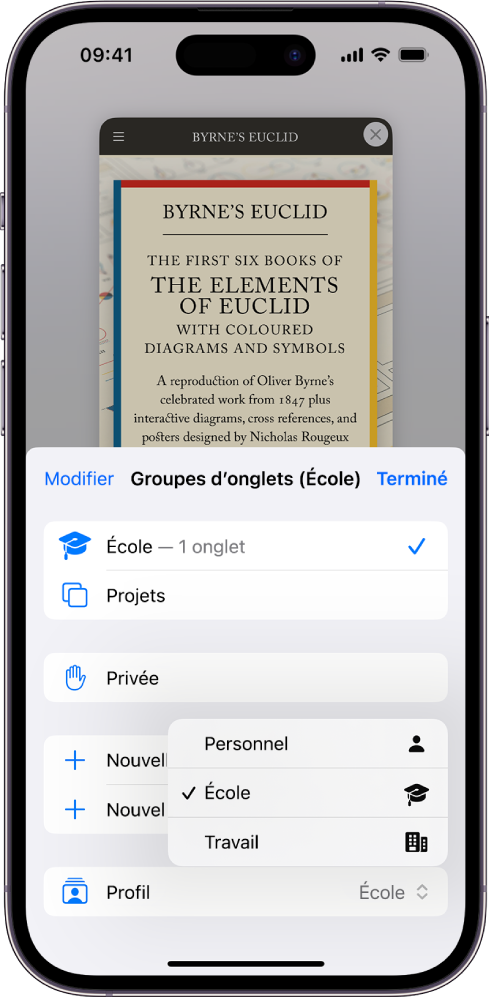

Analysis of image: images/ios17_page_008_nb_01.png

A smartphone displaying Byrne's Euclid book information with tab management options.

Hashtags: #ByrnesEuclid #GeometryLove #EuclidsElements #Mathematics #VintageMath #InteractiveLearning

Emojis: 📚📐🔢🎨📖✨

Done: 04-Jan-2024 15:06:50
Prompt tokens = 708 | Completion tokens = 61 | Total tokens = 769

[Note] These results are generated by an AI

15 Extracted image file: images/ios17_page_009_nb_01.png


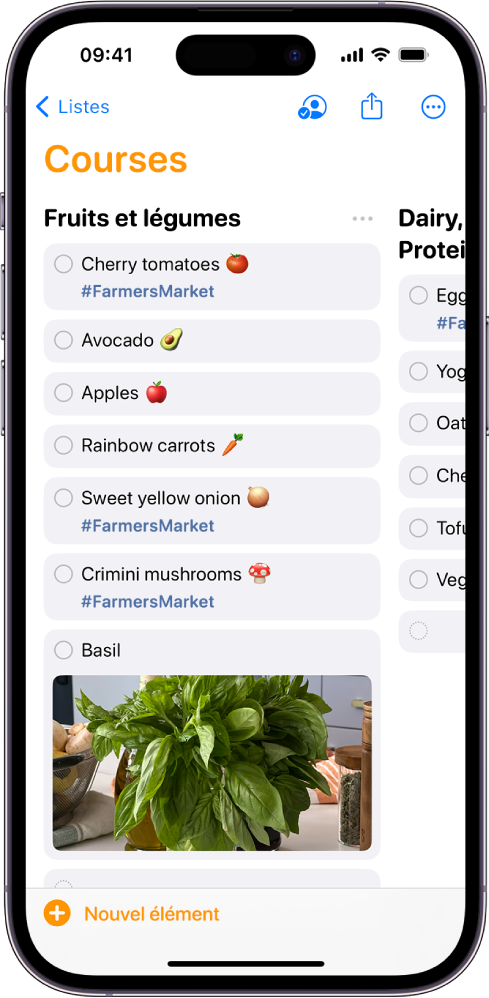

Analysis of image: images/ios17_page_009_nb_01.png

A grocery list on a smartphone app featuring various fruits, vegetables, and other items, tagged with #FarmersMarket.

Hashtags: #GroceryList #HealthyEating #FarmersMarketFinds #FreshProduce

Emojis: 🍅🥑🍏🥕🧅🍄🌿📱🛒

Done: 04-Jan-2024 15:07:31
Prompt tokens = 664 | Completion tokens = 76 | Total tokens = 740

[Note] These results are generated by an AI

16 Extracted image file: images/ios17_page_009_nb_02.png


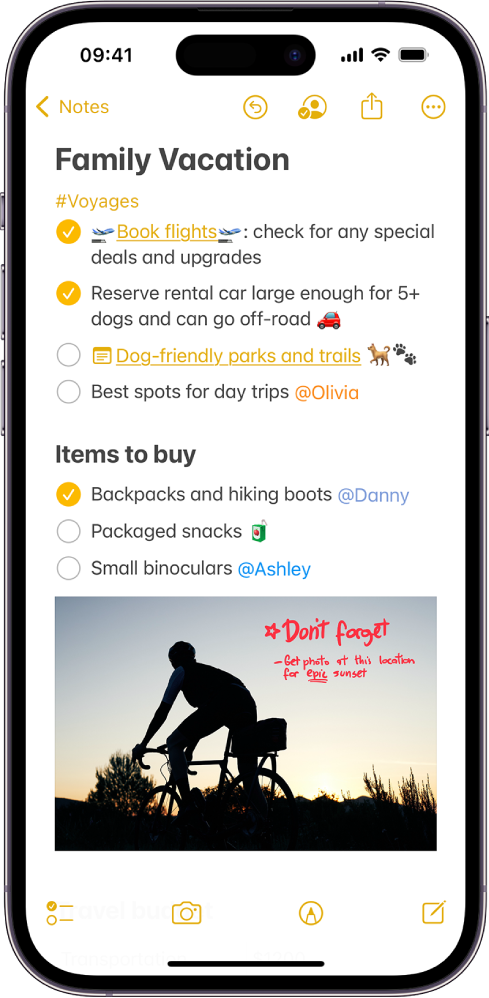

Analysis of image: images/ios17_page_009_nb_02.png

A checklist for a family and pet-friendly vacation planning with a reminder for a sunset photo.

Hashtags: #FamilyVacation #TravelPrep #AdventureTime #SunsetMemories #PetFriendlyTravel 🌅🐾🚗👨‍👩‍👧‍👦🏞️🌲🥾

Emojis: ✈️🚙🐕🏕️👟🔭🌄

Done: 04-Jan-2024 15:08:11
Prompt tokens = 681 | Completion tokens = 104 | Total tokens = 785

[Note] These results are generated by an AI

17 Extracted image file: images/ios17_page_010_nb_01.png


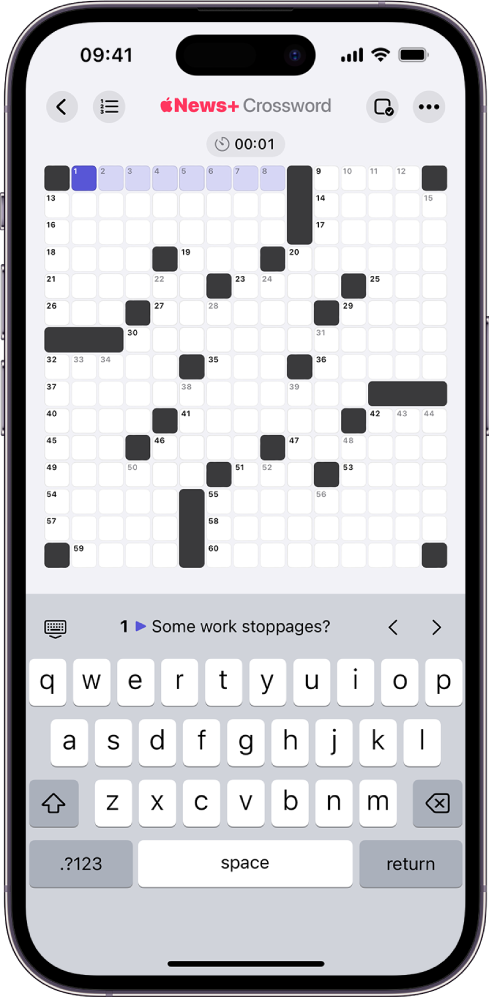

Analysis of image: images/ios17_page_010_nb_01.png

A crossword puzzle on a smartphone screen with a clue displayed.

#CrosswordPuzzle #BrainTeasers 🧩🤔✏️

Done: 04-Jan-2024 15:08:48
Prompt tokens = 760 | Completion tokens = 30 | Total tokens = 790

[Note] These results are generated by an AI


End


In [22]:
print("Analysing all extracted images with Azure Open AI GPT4 Turbo with Vision\n")

for idx in range(len(images_list)):
    # Print image filename
    print(f"{idx+1:02} Extracted image file: {images_list[idx]}")
    # Display image
    display(PILimage.open(images_list[idx]))
    # Run the GPT4 Turbo Vision model
    GPT4V_with_AzureAIVision(images_list[idx], "Describe this in one line and generate some hashtags and emojis.")
    # Pause to avoid 429 errors
    time.sleep(30)

print("\nEnd")